In [ ]:
# TODO: Modify to allow testing on all images in experiment sets to get overall performance metrics for zero-shot case
# Next: add benchmarking of Grounding-Dino, OWL-V2
# After: add finetuning on k synthetic train examples; test again (randomly select the k examples)
# synthetic_path = "/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/RawData/Syn"
# syn labels in coco format are under synthetic_path, images in images dir

# --> add imports to conda env as needed

import os
labels_path="/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2022_location_Unseen_2023_genotype/test/labels"
# image_path="/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2022_location_Unseen_2023_genotype/test/images"

In [20]:
from ultralytics.data.converter import convert_coco
import os

label_conversion_paths = ["/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/test/labels", 
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2022_location_Unseen_2023_genotype/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_location_Unseen_2022_genotype/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_davis_year_genotype_Unseen_kearney/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_davis_year_Unseen_kearney_genotype/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_kearney_year_genotype_Unseen_davis/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_kearney_year_Unseen_davis_genotype/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_genotype/test/labels",
"/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_Unseen_genotype/V0/test/labels"
]

yolo_label_paths = []
image_paths = []
# in all label_paths go to ../images to get images

for labels_path in label_conversion_paths:
    image_paths.append(os.path.abspath(os.path.join(labels_path, "../images")))
    # labels_path is a file path, so we take dirname first to get the folder
    base_dir = os.path.dirname(labels_path)
    # create save_dir as a sibling to 'labels' (path/to/test/yolo_labels)
    save_dir = os.path.abspath(os.path.join(base_dir, "../yolo_labels"))
    
    convert_coco(
        labels_dir=labels_path,
        save_dir=save_dir,
        use_keypoints=False,
    )
    # Update labels_path to point to the directory where yolo labels are saved
    # convert_coco creates 'labels' subdirectory inside save_dir and saves the yolo annotations inside a {coco_filename} subdir
    # where {coco_filename} is the name of the coco file without .json

    labels_path = os.path.join(save_dir, "labels/_annotations.coco")
    yolo_label_paths.append(labels_path)

Annotations /group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/test/labels/_annotations.coco.json: 100% ━━━━━━━━━━━━ 502/502 479.9it/s 1.0s0.0s
COCO data converted successfully.
Results saved to /group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/yolo_labels
Annotations /group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/test/labels/_annotations.coco.json: 100% ━━━━━━━━━━━━ 502/502 479.9it/s 1.0s9s
COCO data converted successfully.
Results saved to /group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/yolo_labels
Annotations /group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2022_location_Unseen_2023_genotype/test/labels/_annotations.coco.json: 100% ━━━━━━━━━━━━ 115/115 364.1it/s 0.3s0.0s
COCO data converted successfully.
Results saved to /group/jmearlesgrp/GE

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/yolo_labels/labels/_annotations.coco


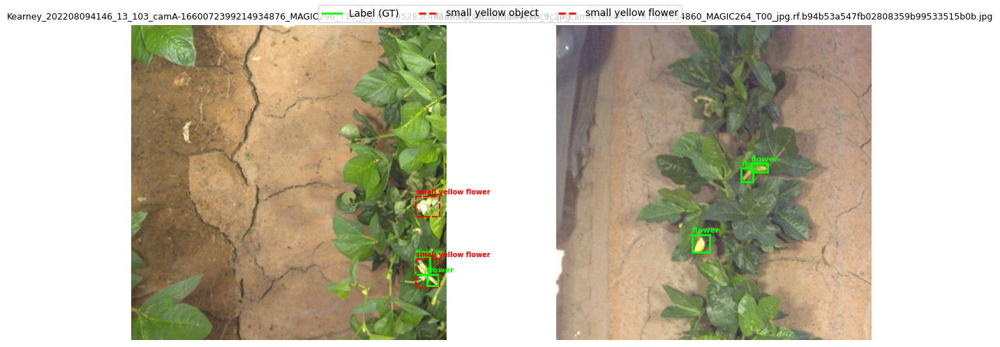

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2022_location_Unseen_2023_genotype/yolo_labels/labels/_annotations.coco


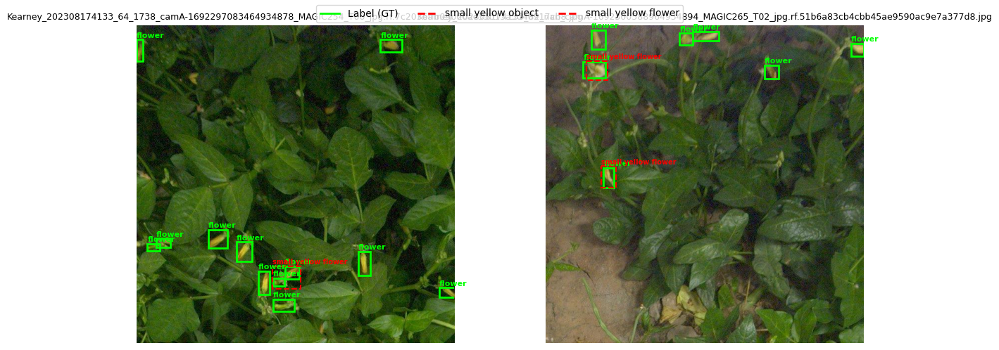

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_Location_Genotype_Unseen_2022/yolo_labels/labels/_annotations.coco


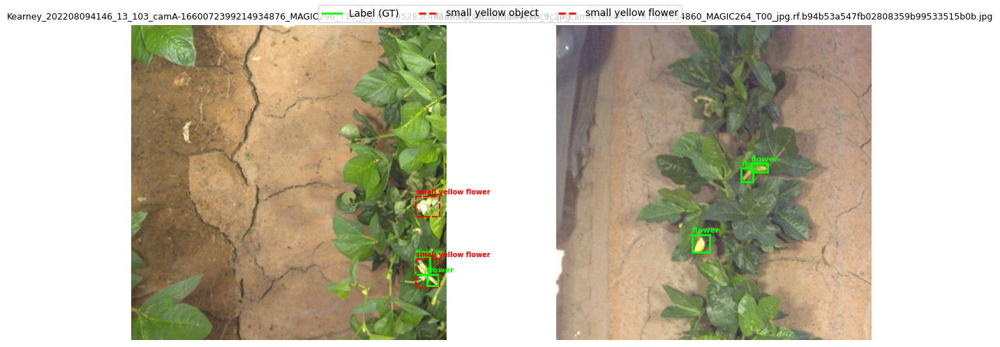

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_2023_location_Unseen_2022_genotype/yolo_labels/labels/_annotations.coco


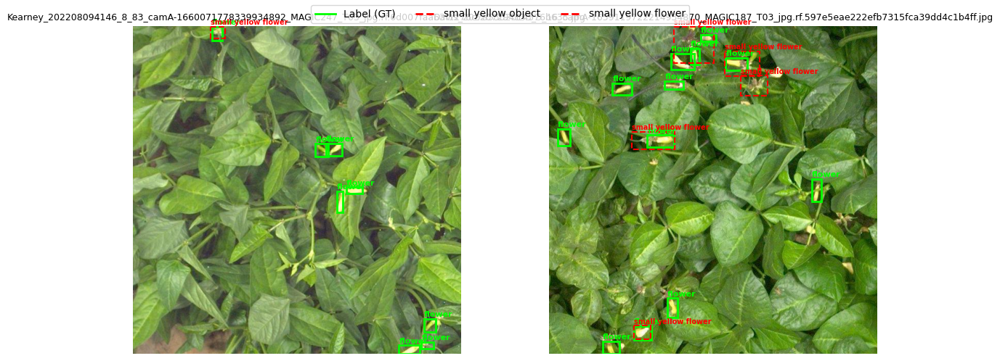

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_davis_year_genotype_Unseen_kearney/yolo_labels/labels/_annotations.coco


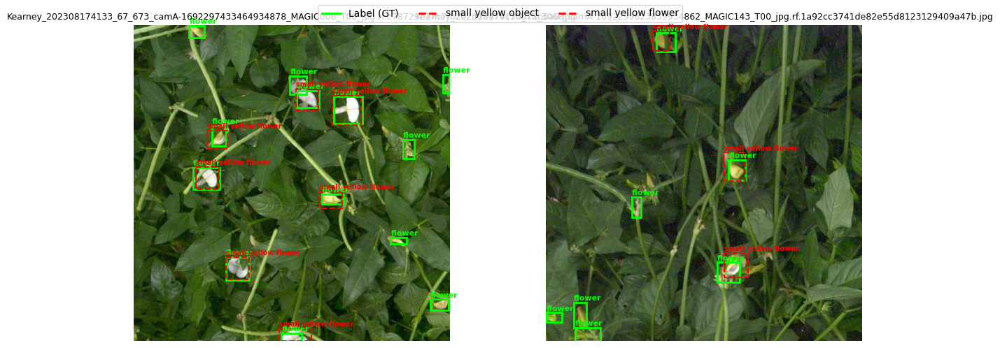

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_davis_year_Unseen_kearney_genotype/yolo_labels/labels/_annotations.coco


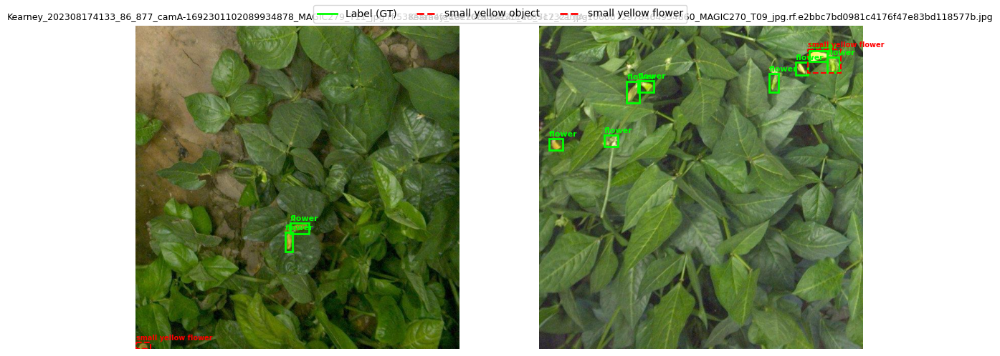

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_kearney_year_genotype_Unseen_davis/yolo_labels/labels/_annotations.coco


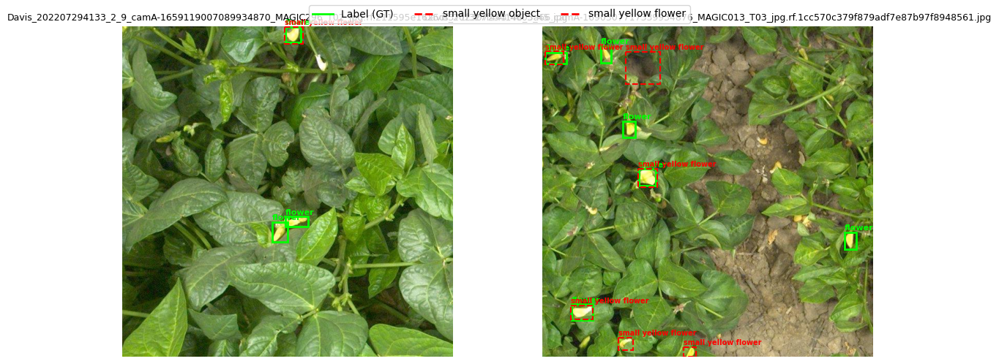

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_kearney_year_Unseen_davis_genotype/yolo_labels/labels/_annotations.coco


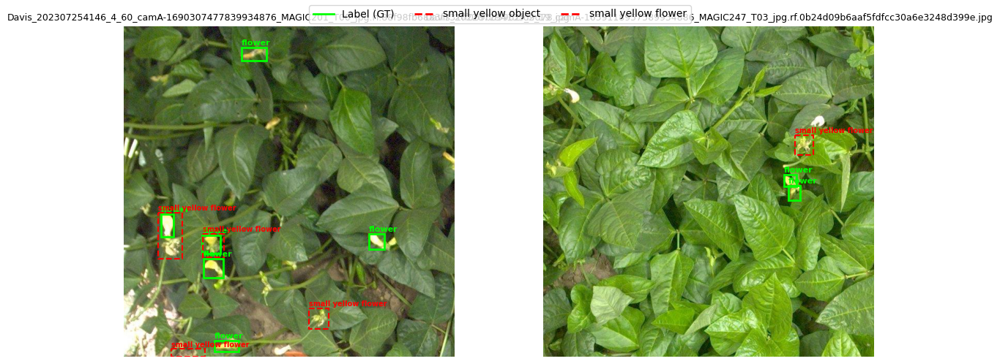

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_genotype/yolo_labels/labels/_annotations.coco


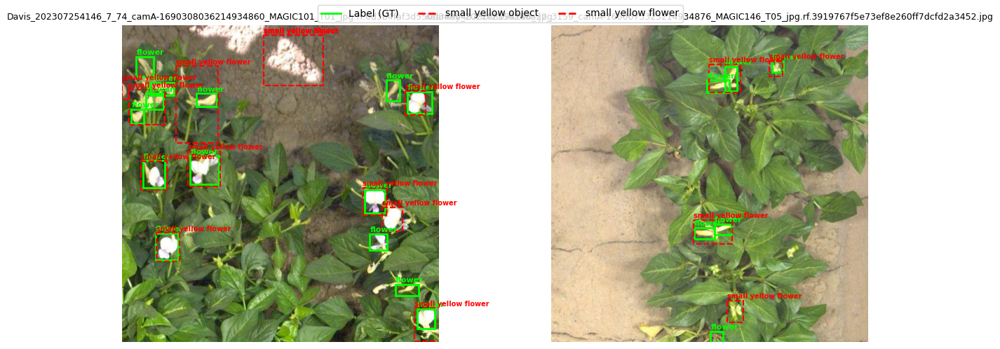

/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_Unseen_genotype/V0/yolo_labels/labels/_annotations.coco


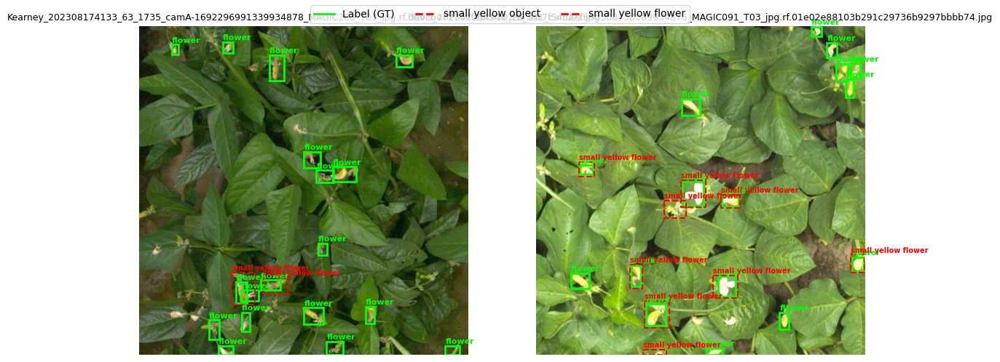

In [ ]:
from pathlib import Path

from vlme import run_gt_vs_predictions

for i in range(len(image_paths)):
    image_path = image_paths[i]
    labels_path = yolo_label_paths[i]
    print(labels_path)
    # --- User inputs ---
    NUM_IMAGES = 2
    RANDOM_SEED = 101
    IMAGES_DIR = image_path
    LABELS_DIR = labels_path
    MODEL_WEIGHTS_PATH = "model_weights/yolov8x-worldv2.pt" 
    GT_CLASS_NAMES = ["flower"]
    OPEN_SET_CLASS_NAMES = [
        "small yellow flower", 
        "small white flower",
        ""
    ]
    PREDICT_KWARGS = {
        "imgsz": 1280,
        "conf": 0.1,
        "max_det": 500,
        "verbose": False,
        "iou": 0.3
    }

    _, _, results_list = run_gt_vs_predictions(
        images_dir=IMAGES_DIR,
        labels_dir=LABELS_DIR,
        num_images=NUM_IMAGES,
        random_seed=RANDOM_SEED,
        class_names=GT_CLASS_NAMES,
        yolo_classes=OPEN_SET_CLASS_NAMES,
        weights_path=MODEL_WEIGHTS_PATH,
        predict_kwargs=PREDICT_KWARGS,
        ncols=2,
        show=True,
        return_results=True,
    )

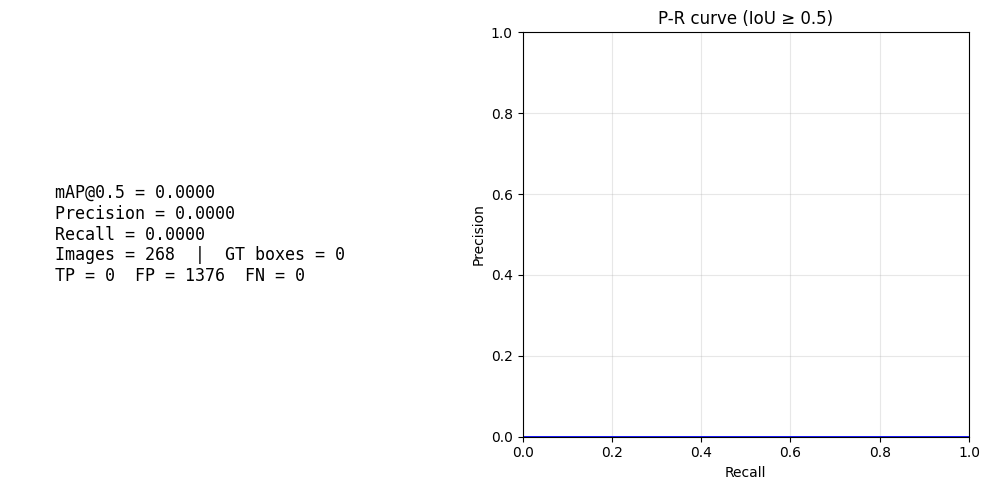

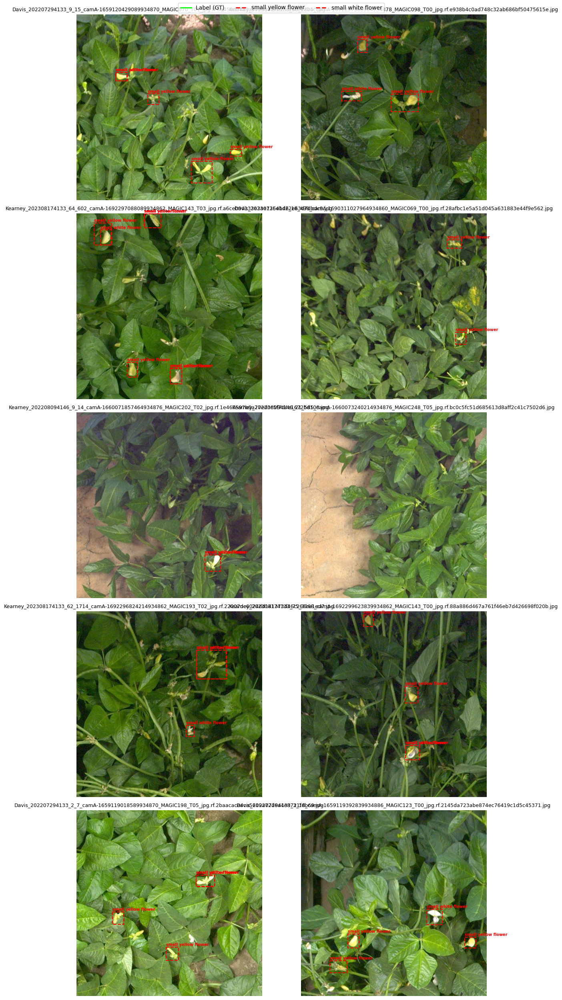

In [22]:
from vlme import run_evaluation
from pathlib import Path

# NUM_IMAGES_TO_EVAL = 10
NUM_IMAGES_TO_PLOT = 10
RANDOM_SEED = 100
#IMAGES_DIR = image_path
IMAGES_DIR = "/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_genotype/test/images"
# LABELS_DIR = labels_path
LABELS_DIR = "/group/jmearlesgrp/GEMINI/lars/grounding/AgVFM/_data/Flower/Exps/Seen_location_year_genotype/test/yolo_labels/_annotations.coco"
MODEL_WEIGHTS_PATH = "../model_weights/yolov8x-worldv2.pt"
GT_CLASS_NAMES = ["flower"]
OPEN_SET_CLASS_NAMES = [
    "small yellow flower", 
    "small white flower",
    ""
]
PREDICT_KWARGS = {
    "imgsz": 1280,
    "conf": 0.1,
    "max_det": 500,
    "verbose": False,
    "iou": 0.3
}
# removed NUM_IMAGES_TO_EVAL to run on all images in the set for overall performance metrics for zero-shot case
# Limited set (e.g. 50 images, repeatable)
metrics = run_evaluation(
    images_dir=IMAGES_DIR, 
    labels_dir=LABELS_DIR,
    random_seed=RANDOM_SEED,
    class_names=GT_CLASS_NAMES,
    yolo_classes=OPEN_SET_CLASS_NAMES,
    plot_summary=True,
    plot_pr_curve=True,
    plot_sample=NUM_IMAGES_TO_PLOT,
    predict_kwargs=PREDICT_KWARGS
)